<a href="https://colab.research.google.com/github/Nojaakto/Nojaakto/blob/main/04_image_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# WMM - Lab. 4 - Podstawowe przetwarzanie obrazów
Mikołaj Karol Kuranowski

Numer obrazu: 27

| Katalog         | Nazwa obrazu             |
|-----------------|--------------------------|
| `color`         | `rafting_col.png`        |
| `color_inoise1` | `rafting_col_inoise.png` |
| `color_inoise2` | `rafting_col_inoise.png` |
| `color_noise`   | `rafting_col_noise.png`  |

In [ ]:
from table2md import MarkdownTable
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [ ]:
def load_color_image(path):
    """Loads a color image using cv2"""
    return cv2.imread(path, cv2.IMREAD_COLOR)

def calculate_psnr(reference_img, modified_img):
    """Calculates the PSNR of an image. The image is assumed to be
    stored as uint8, where the minimum possible value for a pixel is 0,
    and the maximum possible value is a 255.
    """
    max = 255 * 255
    mse = np.square(reference_img.astype("f") - modified_img.astype("f")).sum() / reference_img.size
    return 10 * np.log10(max / mse)

def show_image_on_subplot(img, title, nrows, ncols, index, small_title=False):
    """Puts a uint8 BGR image (`img`) on a plt.subplot with a given `title`.
    `nrows`, `ncols` and `index` are passed through to plt.subplot.
    
    If `small_title` is True, the title will be given a font_size = 6.
    Otherwise, the font size will be up to matplotlib.
    """
    subplot = plt.subplot(nrows, ncols, index)
    subplot.set_title(title, {"fontsize": "6"} if small_title else {})
    subplot.set_xticks([])
    subplot.set_yticks([])
    subplot.imshow(img[...,::-1], vmin=0, vmax=255)  # swap BGR to RGB

## Filtracja

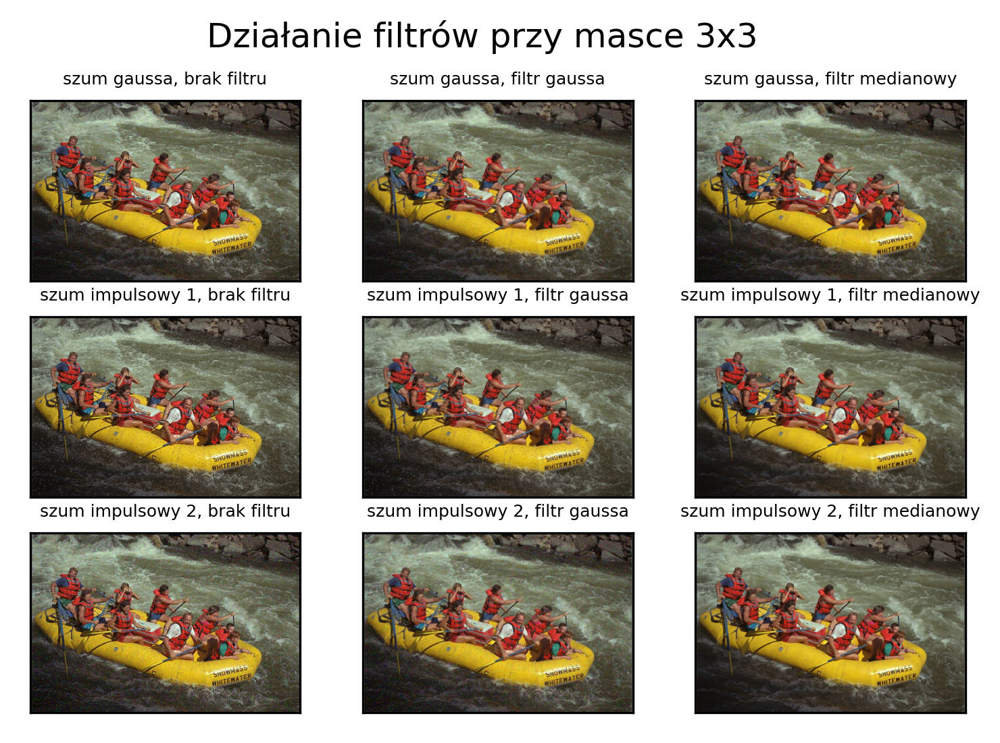

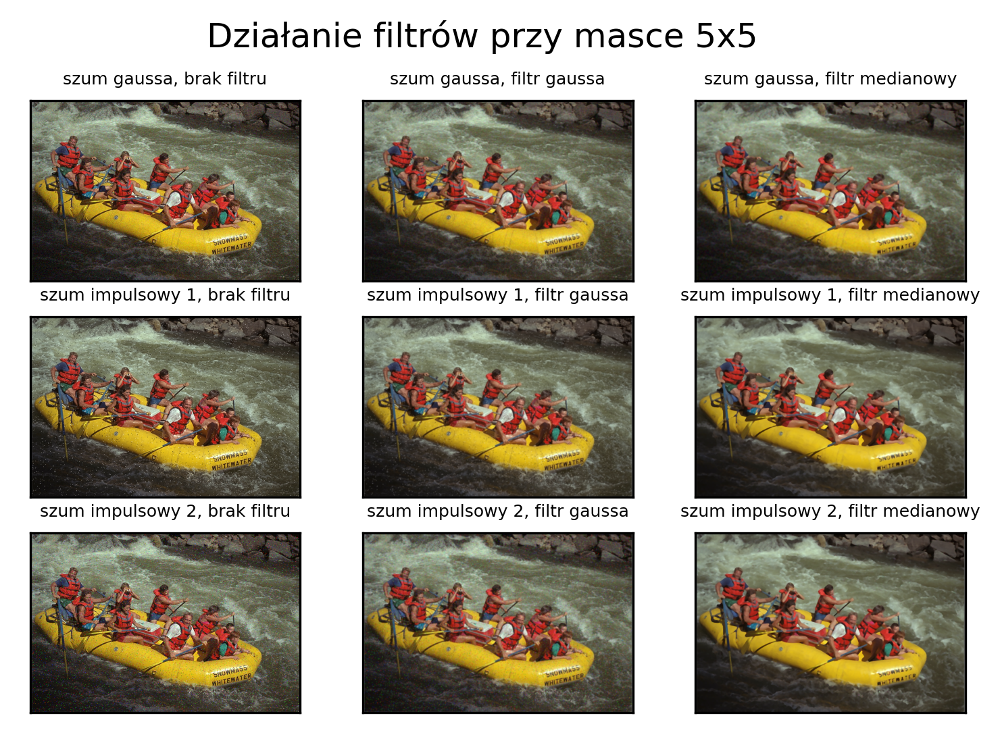

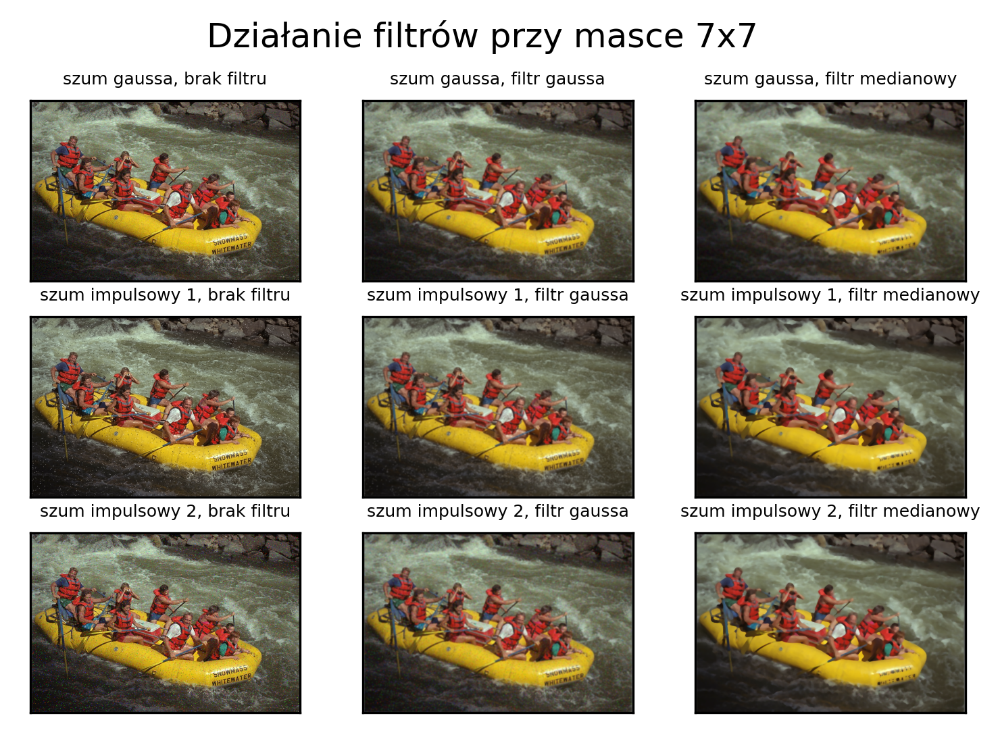

|  obraz źródłowy  |      filtr      | rozmiar maski |   psnr  |
|------------------|-----------------|---------------|---------|
| szum gaussa      | brak filtru     | 3             | 24.8716 |
| szum gaussa      | filtr gaussa    | 3             | 28.3161 |
| szum gaussa      | filtr medianowy | 3             | 27.2521 |
| szum impulsowy 1 | brak filtru     | 3             | 22.8002 |
| szum impulsowy 1 | filtr gaussa    | 3             | 27.4781 |
| szum impulsowy 1 | filtr medianowy | 3             | 29.2120 |
| szum impulsowy 2 | brak filtru     | 3             | 20.9202 |
| szum impulsowy 2 | filtr gaussa    | 3             | 26.5281 |
| szum impulsowy 2 | filtr medianowy | 3             | 29.1159 |
| szum gaussa      | brak filtru     | 5             | 24.8716 |
| szum gaussa      | filtr gaussa    | 5             | 27.0505 |
| szum gaussa      | filtr medianowy | 5             | 25.2439 |
| szum impulsowy 1 | brak filtru     | 5             | 22.8002 |
| szum impulsowy 1 | filt

In [ ]:
%matplotlib inline

image_ref = load_color_image("04_pictures/color.png")
image_noise = load_color_image("04_pictures/color_noise.png")
image_inoise1 = load_color_image("04_pictures/color_inoise1.png")
image_inoise2 = load_color_image("04_pictures/color_inoise2.png")

images_to_show = [
    ("szum gaussa", image_noise),
    ("szum impulsowy 1", image_inoise1),
    ("szum impulsowy 2", image_inoise2),
]

filters_to_apply = [
    ("brak filtru", lambda img, _: img),
    ("filtr gaussa", lambda img, mask_size: cv2.GaussianBlur(img, (mask_size, mask_size), 0)),
    ("filtr medianowy", lambda img, mask_size: cv2.medianBlur(img, mask_size)),
]

psnr_results = []

for mask_size in (3, 5, 7):
    plt.suptitle(f"Działanie filtrów przy masce {mask_size}x{mask_size}")

    for row, (src_img_title, src_img) in enumerate(images_to_show):
        for col, (filter_name, filter_func) in enumerate(filters_to_apply):
            img_with_filter = filter_func(src_img, mask_size)

            show_image_on_subplot(
                img_with_filter,
                src_img_title + ", " + filter_name,
                len(images_to_show),
                len(filters_to_apply),
                len(filters_to_apply) * row + col + 1,
                small_title=True,
            )

            psnr_results.append({
                "obraz źródłowy": src_img_title,
                "filtr": filter_name,
                "rozmiar maski": mask_size,
                "psnr": f"{calculate_psnr(image_ref, img_with_filter):.4f}"
            })

    plt.gcf().set_dpi(300)
    plt.show()

MarkdownTable.from_dicts(psnr_results).print()

### Zestawienie PSNR dla różnych filtrów

|  obraz źródłowy  |      filtr      | rozmiar maski |   psnr  |
|------------------|-----------------|---------------|---------|
| szum gaussa      | brak filtru     | -             | 24.8716 |
| szum impulsowy 1 | brak filtru     | -             | 22.8002 |
| szum impulsowy 2 | brak filtru     | -             | 20.9202 |
| szum gaussa      | filtr gaussa    | 3             | 28.3205 |
| szum impulsowy 1 | filtr gaussa    | 3             | 27.4847 |
| szum impulsowy 2 | filtr gaussa    | 3             | 26.5338 |
| szum gaussa      | filtr gaussa    | 5             | 27.0534 |
| szum impulsowy 1 | filtr gaussa    | 5             | 26.6562 |
| szum impulsowy 2 | filtr gaussa    | 5             | 26.1764 |
| szum gaussa      | filtr gaussa    | 7             | 25.7260 |
| szum impulsowy 1 | filtr gaussa    | 7             | 25.5251 |
| szum impulsowy 2 | filtr gaussa    | 7             | 25.2918 |
| szum gaussa      | filtr medianowy | 3             | 27.2521 |
| szum impulsowy 1 | filtr medianowy | 3             | 29.2120 |
| szum impulsowy 2 | filtr medianowy | 3             | 29.1159 |
| szum gaussa      | filtr medianowy | 5             | 25.2439 |
| szum impulsowy 1 | filtr medianowy | 5             | 25.7532 |
| szum impulsowy 2 | filtr medianowy | 5             | 25.7377 |
| szum gaussa      | filtr medianowy | 7             | 24.0516 |
| szum impulsowy 1 | filtr medianowy | 7             | 24.2972 |
| szum impulsowy 2 | filtr medianowy | 7             | 24.2890 |


### Wnioski

Możemy zaobserwować, że filtr Gaussa lepiej radzi sobie z odszumianiem obrazów z
szumem Gaussa, a filtr medianowy lepiej radzi sobie z szumem impulsowym. Jednak to
rozmiar maski bardziej wpływa na jakość odszumiania - im większa maska tym gorsze wyniki
odszumiania - w szczególności widać to przy masce 7x7.

Wskaźnik PSNR nie zawsze odpowiada subiektywnym odczuciom - w szczególności dotyczy to
filtracji Gaussa na szumie impulsowym, gdzie mimo wyższego PSNR nadal widoczne są artefakty na obrazie.

## Wyrównanie histogramu

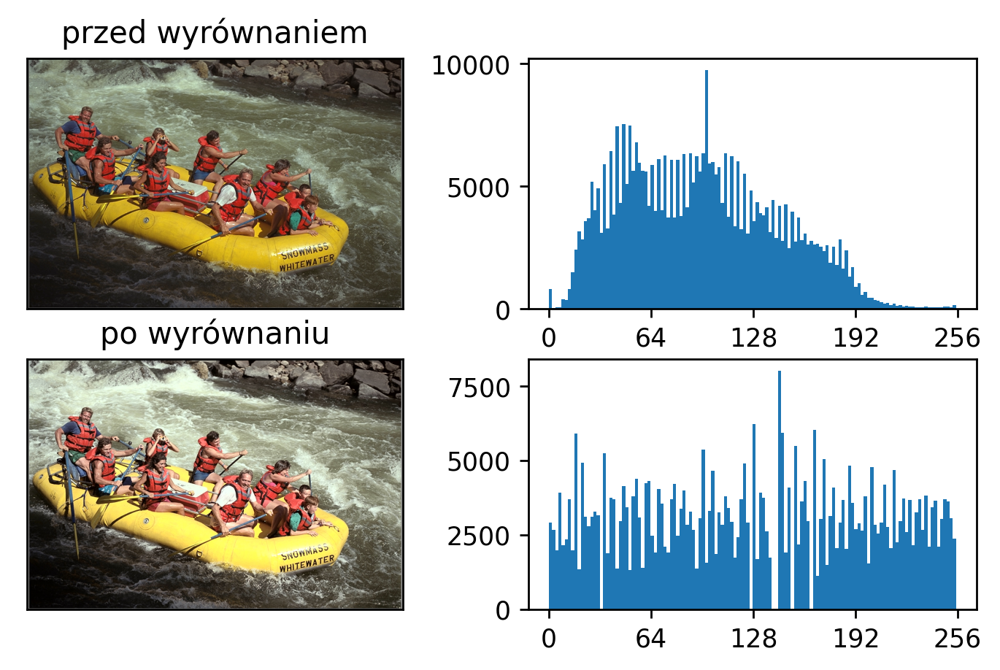

True

In [ ]:
%matplotlib inline

image = load_color_image("04_pictures/color.png")
image_ycbcr = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)

image_equalized_ycbcr = image_ycbcr.copy()
image_equalized_ycbcr[...,0] = cv2.equalizeHist(image_equalized_ycbcr[...,0])
image_equalized = cv2.cvtColor(image_equalized_ycbcr, cv2.COLOR_YCrCb2BGR)

# Porównanie obrazów
show_image_on_subplot(image, "przed wyrównaniem", 2, 2, 1)
show_image_on_subplot(image_equalized, "po wyrównaniu", 2, 2, 3)

# Porównanie histogtamów
subplot = plt.subplot(2, 2, 2)
subplot.set_xticks(np.arange(0, 257, 64))
subplot.hist(image_ycbcr[...,0].ravel(), bins=128, range=(0, 255))

subplot = plt.subplot(2, 2, 4)
subplot.set_xticks(np.arange(0, 257, 64))
subplot.hist(image_equalized_ycbcr[...,0].ravel(), bins=128, range=(0, 255))

plt.subplots_adjust(left=0)
plt.gcf().set_dpi(250)
plt.show()

# Zapis obrazu do pliku
cv2.imwrite("04_pictures/color_equalized.png", image_equalized)


### Wnioski

Operacja wyrównania histogramu... wyrównała histogram. W szczególności widać to w punktach w jego
prawej części. Przed wyrównaniem w zasadzie nie było punktów o luminancji większej niż 200, a po
wyrównaniu takie punkty stanowią około ⅕ przyjmowanych wartości.

Wyrównanie składowej luminancji wytwarza nienaturalnie prześwietlony obraz. Subiektywnie oceniając
obraz wynikowy - stracił on głębie kolorów.

## Filtr Laplace'a

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


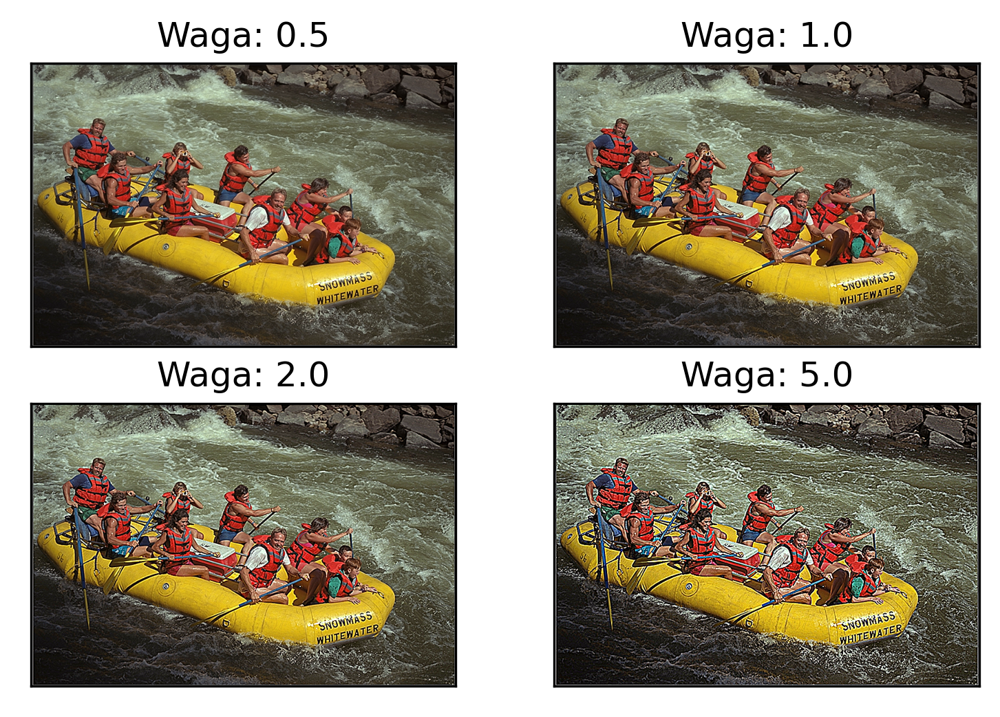

In [ ]:
%matplotlib inline

image = load_color_image("04_pictures/color.png") / 255.0
image_laplace = cv2.Laplacian(
    cv2.GaussianBlur(image, (3, 3), 0),
    cv2.CV_64F,
)

for idx, weight in enumerate([0.5, 1.0, 2.0, 5.0], start=1):
    image_modified = cv2.addWeighted(image, 1, image_laplace, -weight, 0)
    show_image_on_subplot(image_modified, f"Waga: {weight}", 2, 2, idx)

plt.gcf().set_dpi(300)
plt.show()

### Wnioski

> Jaki jest wpływ wagi składowej wysokoczęstotliwościowej na postać obrazu wynikowego?

Im większa waga, tym bardziej uwidocznione są krawędzie obrazu - tym bardziej wydaje się on być
„wyostrzony”.

> Dla jakich wartości tej wagi uzyskuje się dobre, przyjemne dla oka wyniki?

Do wartości około -0.7 wyniki nazwałbym przyjemnymi dla oka. Powyżej tej wartości obraz zaczyna wyglądać nienaturalnie.
W szczególności rzucają się w oczy dwa elementy: wszelkie nierówności na tafli wody są nadto uwidocznione,
a prześwietlenie na czole mężczyzny patrzącego w kierunku fotografa zmienia się w białą plamę.
